# Logs

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx
import pickle

#Paths
base = "/triumvirate/home/alexarol/breast_cancer_analysis"
her2_csv = f"{base}/results/recode_outputs/her2_positive/HER2_Positive_RECODE_sig_genes_cellsxgenes_forWGCNA.csv"
sig_genes_path = f"{base}/results/recode_outputs/her2_positive/HER2_Positive_RECODE_sig_genes_atleast2.txt"

# Helper functions

In [2]:
def add_mito_qc(adata: sc.AnnData) -> sc.AnnData:
    """Flag mitochondrial genes and compute QC metrics."""
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    sc.pp.calculate_qc_metrics(
        adata,
        qc_vars=["mt"],
        percent_top=None,
        log1p=False,
        inplace=True,
    )
    return adata


def summarize_qc(adata, sample_name="sample"):
    """Print QC summary: median, IQR, whiskers for violin metrics."""
    obs = adata.obs
    metrics = ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"]
    print(f"QC summary for {sample_name}")
    print("-" * 60)
    for m in metrics:
        s = obs[m]
        desc = s.describe()
        q1, q3 = desc["25%"], desc["75%"]
        iqr = q3 - q1
        lower_whisker = q1 - 1.5 * iqr
        upper_whisker = q3 + 1.5 * iqr
        print(
            f"{m}: median={desc['50%']:.1f}, IQR=[{q1:.1f}, {q3:.1f}], "
            f"whiskers≈[{lower_whisker:.1f}, {upper_whisker:.1f}], "
            f"min={desc['min']:.1f}, max={desc['max']:.1f}"
        )
    print()


def suggest_qc_thresholds(adata, fixed_min_genes=200, max_mt_cap=20.0):
    """Suggest data-driven QC thresholds from violin distributions."""
    obs = adata.obs
    
    def whiskers(x):
        desc = x.describe()
        q1, q3 = desc["25%"], desc["75%"]
        iqr = q3 - q1
        return q1 - 1.5 * iqr, q3 + 1.5 * iqr
    
    low_w_genes, high_w_genes = whiskers(obs["n_genes_by_counts"])
    min_genes = max(fixed_min_genes, low_w_genes, 0)
    max_genes = high_w_genes
    
    _, high_w_counts = whiskers(obs["total_counts"])
    max_counts = high_w_counts
    
    _, high_w_mt = whiskers(obs["pct_counts_mt"])
    max_pct_mt = min(high_w_mt, max_mt_cap)
    
    thresholds = {
        "min_genes": float(min_genes),
        "max_genes": float(max_genes),
        "max_counts": float(max_counts),
        "max_pct_mt": float(max_pct_mt),
    }
    
    print("Suggested QC thresholds (from violins):")
    for k, v in thresholds.items():
        print(f"  {k}: {v:.2f}")
    print()
    
    return thresholds

# Loading inital data

In [ ]:
#Load significant genes
sig_genes = pd.read_csv(sig_genes_path)["gene"].tolist()

#Read header to get columns
all_cols = pd.read_csv(her2_csv, nrows=0).columns.tolist()
cell_col = all_cols[0]
expr_cols = all_cols[1:]

#Intersect with sig genes
genes = pd.Index(sig_genes).intersection(expr_cols)

#Cap at 10000 for initial QC/visualization
if len(genes) > 10000:
    genes = genes[:10000]

usecols = [cell_col] + genes.tolist()

print(f"Loading HER2_positive data with {len(genes)} genes for QC")
df = pd.read_csv(her2_csv, usecols=usecols, dtype={cell_col: str})

expr = df.iloc[:, 1:]
expr.index = df.iloc[:, 0].astype(str)

adata_her2 = sc.AnnData(X=expr.values)
adata_her2.obs_names = expr.index
adata_her2.var_names = expr.columns

print(f"Initial shape: {adata_her2.shape}")

Loading HER2_positive data with 10000 genes for QC...
Initial shape: (19693, 10000)


# Flaging mitochondrial and ribosomal genes

In [8]:
#Mitochondrial
adata_her2 = add_mito_qc(adata_her2)

#Ribosomal
ribo_url = "http://software.broadinstitute.org/gsea/msigdb/download_geneset.jsp?geneSetName=KEGG_RIBOSOME&fileType=txt"
ribo_genes = pd.read_table(ribo_url, skiprows=2, header=None)
ribo_symbols = ribo_genes[0].values
adata_her2.var["ribo"] = adata_her2.var_names.isin(ribo_symbols)

#Compute QC metrics
sc.pp.calculate_qc_metrics(
    adata_her2,
    qc_vars=["mt", "ribo"],
    percent_top=None,
    log1p=False,
    inplace=True,
)

print(adata_her2)

AnnData object with n_obs × n_vars = 19693 × 10000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'


In [9]:
adata_her2.obs.head()

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
Unnamed: 0,,,,,,
1,2027,8690,984,11.323360,2828,32.543153
2,2341,8430,276,3.274021,1605,19.039146
3,2620,10251,882,8.604039,1424,13.891328
4,2243,9894,739,7.469173,3899,39.407722
5,1783,6534,743,11.371289,2138,32.721151


In [10]:
adata_her2.var.head()

,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,ribo
A1BG,False,2537,0.188544,87.117250,3713,False
A1BG-AS1,False,333,0.017925,98.309044,353,False
A2M,False,440,0.038643,97.765704,761,False
A2M-AS1,False,157,0.008429,99.202762,166,False
A2ML1,False,76,0.004012,99.614076,79,False


In [11]:
#Checking least/most expressed genes
adata_her2.var.sort_values("n_cells_by_counts").head()

,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,ribo
ALX4,False,2,0.000102,99.989844,2,False
IGHV7-4-1,False,2,0.000254,99.989844,5,False
LANCL1-AS1,False,2,0.000102,99.989844,2,False
P2RY12,False,2,0.000102,99.989844,2,False
IGLV4-60,False,2,0.000609,99.989844,12,False


In [12]:
adata_her2.var.sort_values("n_cells_by_counts", ascending=False).head()

,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,ribo
RPL41,False,19499,81.646880,0.985122,1607872,True
RPLP1,False,19429,76.074544,1.340578,1498136,True
RPS18,False,19388,80.622556,1.548774,1587700,True
MT-CO3,True,19383,157.721373,1.574163,3106007,False
FTH1,False,19363,72.189611,1.675722,1421630,False


# Filtering Genes (min_cells=3)

In [13]:
print(f"Genes before filtering: {adata_her2.n_vars}")

gene_counts = np.zeros(adata_her2.n_vars, dtype=np.int64)

chunksize = 2000
n_chunks = int(np.ceil(adata_her2.n_obs / chunksize))

print(f"Counting gene presence across {adata_her2.n_obs} cells in {n_chunks} chunks")
for i in range(n_chunks):
    start = i * chunksize
    end = min((i + 1) * chunksize, adata_her2.n_obs)
    
    chunk = adata_her2.X[start:end, :]
    
    #Handle dense vs sparse
    if hasattr(chunk, "toarray"):  #sparse matrix
        chunk = chunk.toarray()
    
    #Count how many cells have expression > 0 per gene
    gene_counts += (chunk > 0).sum(axis=0)
    
    if (i + 1) % 10 == 0 or i == n_chunks - 1:
        print(f"  Processed chunk {i+1}/{n_chunks}")

#Keep genes expressed in at least 3 cells
genes_keep_mask = gene_counts >= 3
print(f"Genes passing min_cells=3: {genes_keep_mask.sum()} / {adata_her2.n_vars}")

adata_her2 = adata_her2[:, genes_keep_mask]
print(f"Genes after filtering: {adata_her2.n_vars}")

Genes before filtering: 10000
Counting gene presence across 19693 cells in 10 chunks
  Processed chunk 10/10
Genes passing min_cells=3: 9993 / 10000
Genes after filtering: 9993


# QC Violin Plots (Pre-filtering)

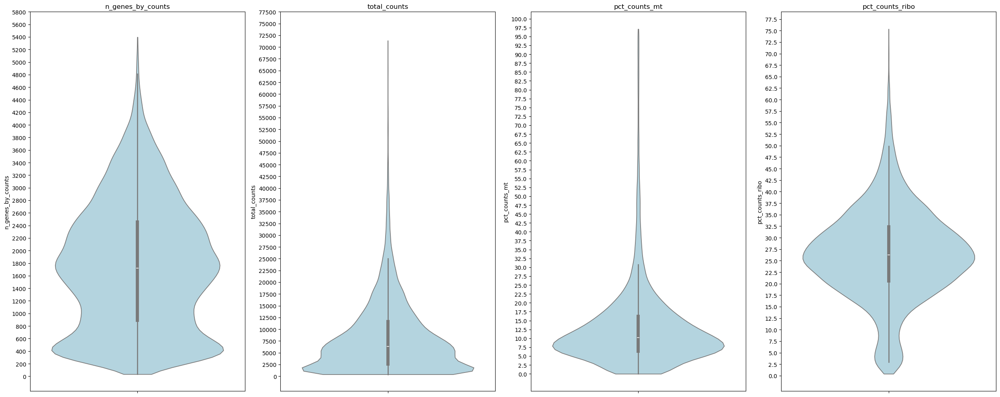

In [18]:
metrics = ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"]

fig, axes = plt.subplots(1, 4, figsize=(25, 10))

for i, m in enumerate(metrics):
    sns.violinplot(
        y=adata_her2.obs[m],
        ax=axes[i],
        inner="box",
        cut=0,
        color="lightblue",
    )
    axes[i].set_title(m)

#Custom y-ticks
axes[0].set_yticks(np.arange(0, 6000, 200))     
axes[1].set_yticks(np.arange(0, 80000, 2500))    
axes[2].set_yticks(np.arange(0, 101, 2.5))       
axes[3].set_yticks(np.arange(0, 80.0, 2.5)) 

plt.tight_layout()
plt.show()

In [19]:
summarize_qc(adata_her2, sample_name="HER2_positive")
thr_her2 = suggest_qc_thresholds(adata_her2)

# Override max_pct_mt to None (no mito filtering, cancer-specific reasoning)
thr_her2["max_pct_mt"] = None

QC summary for HER2_positive
------------------------------------------------------------
n_genes_by_counts: median=1722.0, IQR=[888.0, 2458.0], whiskers≈[-1467.0, 4813.0], min=33.0, max=5397.0
total_counts: median=6332.0, IQR=[2602.0, 11602.0], whiskers≈[-10898.0, 25102.0], min=403.0, max=71386.0
pct_counts_mt: median=10.2, IQR=[6.4, 16.1], whiskers≈[-8.3, 30.8], min=0.0, max=97.1
pct_counts_ribo: median=26.3, IQR=[20.6, 32.3], whiskers≈[3.0, 49.9], min=0.4, max=75.3

Suggested QC thresholds (from violins):
  min_genes: 200.00
  max_genes: 4813.00
  max_counts: 25102.00
  max_pct_mt: 20.00



# Applying QC Filters (n_genes and total_counts only)

In [20]:
obs = adata_her2.obs
mask = (
    (obs["n_genes_by_counts"] >= thr_her2["min_genes"]) &
    (obs["n_genes_by_counts"] <= thr_her2["max_genes"]) &
    (obs["total_counts"] <= thr_her2["max_counts"])
)

print(f"Cells before QC: {adata_her2.n_obs}")
print(f"Cells after QC: {mask.sum()}")

adata_her2 = adata_her2[mask]
print(f"{adata_her2.n_obs} cells remain after QC")

Cells before QC: 19693
Cells after QC: 18762
18762 cells remain after QC


# Post-QC Violin Plots

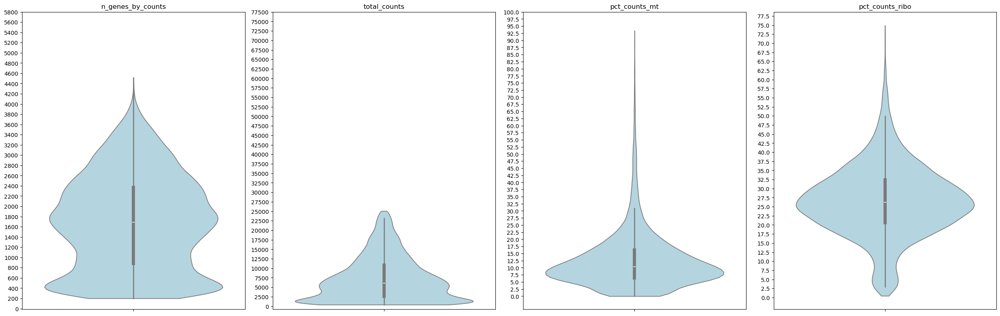

In [22]:
fig, axes = plt.subplots(1, 4, figsize=(25, 8))

for i, m in enumerate(metrics):
    sns.violinplot(
        y=adata_her2.obs[m],
        ax=axes[i],
        inner="box",
        cut=0,
        color="lightblue",
    )
    axes[i].set_title(m, fontsize=12)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")

axes[0].set_yticks(np.arange(0, 6000, 200))     
axes[1].set_yticks(np.arange(0, 80000, 2500))    
axes[2].set_yticks(np.arange(0, 101, 2.5))       
axes[3].set_yticks(np.arange(0, 80.0, 2.5)) 

plt.tight_layout()
plt.show()

# Saving QC-Passed Cell IDs

In [23]:
qc_cells = adata_her2.obs_names.to_list()
pd.Series(qc_cells).to_csv("HER2positive_QC_cells.txt", index=False, header=False)
print(f"Saved {len(qc_cells)} QC-passed cell IDs to HER2positive_QC_cells.txt")

Saved 18762 QC-passed cell IDs to HER2positive_QC_cells.txt


# Chunked Normalization (CP10k + log1p)

In [ ]:
#takes aorund 2 minutes
qc_cells = set(adata_her2.obs_names.astype(str).tolist())
genes_keep = adata_her2.var_names.astype(str).tolist()

chunk_iter = pd.read_csv(her2_csv, index_col=0, chunksize=1000)

out_path = "HER2positive_QC_CP10k_log1p_forWGCNA.csv"
first_chunk = True

print("Starting chunked normalization")
for i, chunk in enumerate(chunk_iter):
    if i % 50 == 0:
        print(f"  Processing chunk {i}")
    
    chunk.index = chunk.index.astype(str)
    
    # Keep only QC-passed cells
    chunk = chunk.loc[chunk.index.intersection(qc_cells)]
    if chunk.empty:
        continue
    
    # Keep only the global gene set
    cols = [g for g in genes_keep if g in chunk.columns]
    chunk = chunk[cols]
    
    # CP10k normalize
    lib_size = chunk.sum(axis=1)
    chunk_norm = chunk.div(lib_size, axis=0) * 1e4
    
    # log1p
    chunk_log = np.log1p(chunk_norm)
    
    # Write/append
    if first_chunk:
        chunk_log.to_csv(out_path)
        first_chunk = False
    else:
        chunk_log.to_csv(out_path, mode="a", header=False)

print(f"Normalized matrix saved to {out_path}")

Starting chunked normalization
  Processing chunk 0


/triumvirate/apps/.scratch/alexarol/ipykernel_284982/1087378581.py:10: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(chunk_iter):
/triumvirate/apps/.scratch/alexarol/ipykernel_284982/1087378581.py:10: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(chunk_iter):
/triumvirate/apps/.scratch/alexarol/ipykernel_284982/1087378581.py:10: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(chunk_iter):
/triumvirate/apps/.scratch/alexarol/ipykernel_284982/1087378581.py:10: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(chunk_iter):


Normalized matrix saved to HER2positive_QC_CP10k_log1p_forWGCNA.csv


# Verifying normalized matrix

In [26]:
#Checking dimensions
n_cells = 0
n_genes = None

chunk_iter = pd.read_csv(out_path, index_col=0, chunksize=500, low_memory=False)

for ch in chunk_iter:
    n_cells += ch.shape[0]
    if n_genes is None:
        n_genes = ch.shape[1]

print(f"Normalized matrix: {n_cells} cells × {n_genes} genes")

Normalized matrix: 18762 cells × 9993 genes


# Compute HVGs (3000 genes, chunked variance)

In [28]:
file_path = out_path
chunksize = 500

n_genes_hvg = None
gene_sum = None
gene_sq_sum = None
n_cells_hvg = 0

chunk_iter = pd.read_csv(file_path, index_col=0, chunksize=chunksize, low_memory=False)

print("Computing per-gene mean and variance")
for ch in chunk_iter:
    ch_values = ch.values.astype(float)
    if n_genes_hvg is None:
        n_genes_hvg = ch_values.shape[1]
        gene_sum = np.zeros(n_genes_hvg, dtype=np.float64)
        gene_sq_sum = np.zeros(n_genes_hvg, dtype=np.float64)
    
    n = ch_values.shape[0]
    n_cells_hvg += n
    gene_sum += ch_values.sum(axis=0)
    gene_sq_sum += (ch_values ** 2).sum(axis=0)

gene_mean = gene_sum / n_cells_hvg
gene_var = gene_sq_sum / n_cells_hvg - gene_mean**2

# Get gene names
chunk_iter = pd.read_csv(file_path, index_col=0, nrows=1)
gene_names = chunk_iter.columns.to_numpy()

hvg_stats = pd.DataFrame({
    "gene": gene_names,
    "mean": gene_mean,
    "var": gene_var
})

# Sort by variance and pick top 3000
hvg_stats_sorted = hvg_stats.sort_values("var", ascending=False)
top_n = 3000
hvg_3000 = hvg_stats_sorted.head(top_n)["gene"].tolist()

print(f"{len(hvg_3000)} HVGs selected")

# Save HVG list
pd.Series(hvg_3000).to_csv("HER2positive_HVG_3000.txt", index=False, header=False)
print("HVG list saved to HER2positive_HVG_3000.txt")

Computing per-gene mean and variance
3000 HVGs selected
HVG list saved to HER2positive_HVG_3000.txt


# Building HVG AnnData for Clustering

In [30]:
hvg_3000 = pd.read_csv("HER2positive_HVG_3000.txt", header=None)[0].astype(str).tolist()

file_path = out_path
chunksize = 1000

cell_ids = []
rows = []

chunk_iter = pd.read_csv(file_path, index_col=0, chunksize=chunksize, low_memory=False)

print("Building HVG AnnData")
for ch in chunk_iter:
    ch = ch[hvg_3000]
    cell_ids.extend(ch.index.astype(str).tolist())
    rows.append(ch.values.astype(np.float32))

X = np.vstack(rows)

adata_hvg = sc.AnnData(X=X)
adata_hvg.obs_names = cell_ids
adata_hvg.var_names = hvg_3000

# Bring over obs metadata from adata_her2
adata_hvg.obs = adata_her2.obs.loc[adata_hvg.obs_names].copy()

print(f"HVG AnnData shape: {adata_hvg.shape}")
print(adata_hvg.obs.head())

Building HVG AnnData
HVG AnnData shape: (18762, 3000)
   n_genes_by_counts  total_counts  total_counts_mt  pct_counts_mt  \
1               2027          8690              984      11.323360   
2               2341          8430              276       3.274021   
3               2620         10251              882       8.604039   
4               2243          9894              739       7.469173   
5               1783          6534              743      11.371289   

   total_counts_ribo  pct_counts_ribo  
1               2828        32.543153  
2               1605        19.039146  
3               1424        13.891328  
4               3899        39.407722  
5               2138        32.721151  


# Quick Gene Correlation Heatmap (Top 50 Variable HVGs)

/triumvirate/apps/.scratch/alexarol/ipykernel_284982/1165864792.py:5: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  subset = pd.read_csv(file_path, index_col=0, nrows=5000)


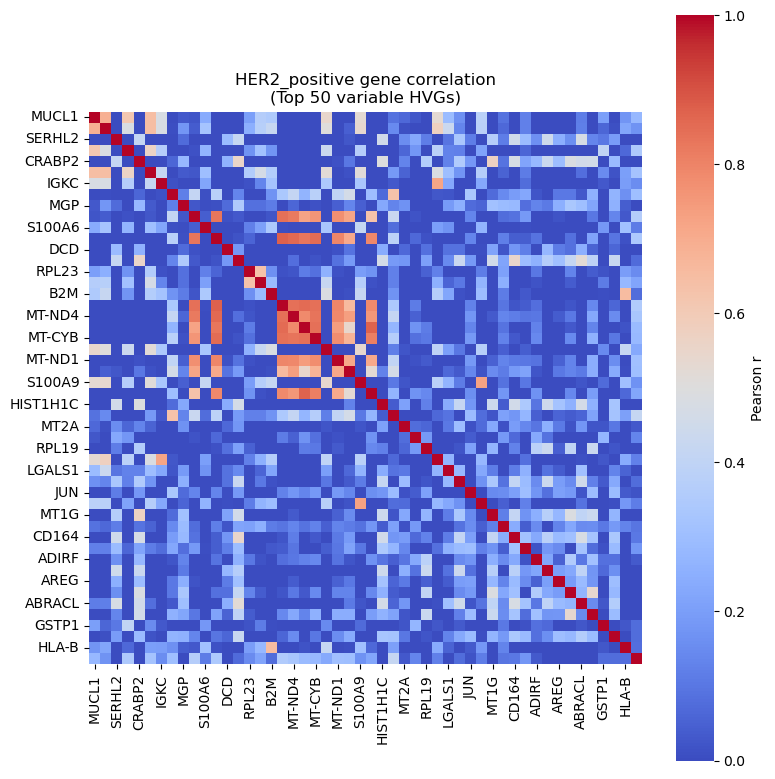

In [32]:
file_path = "HER2positive_QC_CP10k_log1p_forWGCNA.csv"
hvg_3000 = pd.read_csv("HER2positive_HVG_3000.txt", header=None)[0].astype(str).tolist()

# Read a manageable subset of cells to estimate variability (e.g. first 5000)
subset = pd.read_csv(file_path, index_col=0, nrows=5000)
subset = subset[hvg_3000]  # keep HVGs only

# Pick top 50 most variable HVGs within this subset
gene_var = subset.var(axis=0)
top_n = 50
top_genes = gene_var.sort_values(ascending=False).head(top_n).index.tolist()

# Compute full correlation among these 50 genes across ALL cells (chunked)
chunksize = 2000
corr_data = {g: [] for g in top_genes}

chunk_iter = pd.read_csv(file_path, index_col=0, chunksize=chunksize, low_memory=False)
for ch in chunk_iter:
    ch = ch[top_genes]
    for g in top_genes:
        corr_data[g].extend(ch[g].values.tolist())

corr_df = pd.DataFrame(corr_data)
corr_mat = corr_df.corr(method="pearson")

# Plot heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(
    corr_mat,
    cmap="coolwarm",
    vmin=0.0,
    vmax=1.0,
    square=True,
    cbar_kws={"label": "Pearson r"},
)
plt.title("HER2_positive gene correlation\n(Top 50 variable HVGs)")
plt.tight_layout()
plt.show()

# Scale, PCA, Neighbors, UMAP, Leiden

Scaling genes
Computing PCA


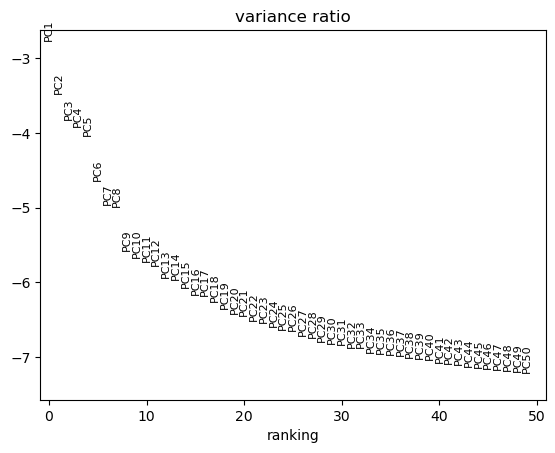

Building neighbor graph (30 PCs)
Computing UMAP
Leiden clustering (resolution=0.5)


/triumvirate/apps/.scratch/alexarol/ipykernel_284982/863761138.py:15: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_hvg, resolution=0.5)


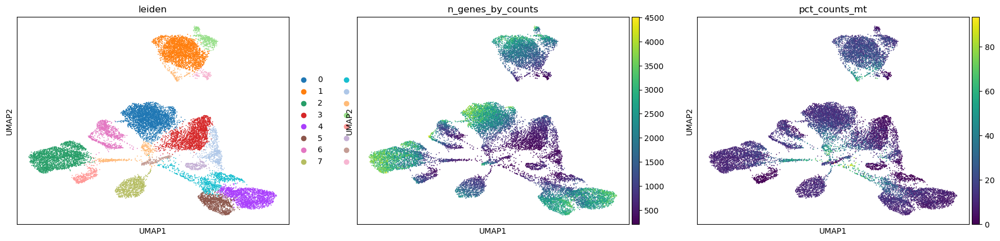

In [33]:
print("Scaling genes")
sc.pp.scale(adata_hvg, max_value=10)

print("Computing PCA")
sc.tl.pca(adata_hvg, svd_solver="arpack")
sc.pl.pca_variance_ratio(adata_hvg, log=True, n_pcs=50)

print("Building neighbor graph (30 PCs)")
sc.pp.neighbors(adata_hvg, n_pcs=30)

print("Computing UMAP")
sc.tl.umap(adata_hvg)

print("Leiden clustering (resolution=0.5)")
sc.tl.leiden(adata_hvg, resolution=0.5)

sc.pl.umap(adata_hvg, color=["leiden", "n_genes_by_counts", "pct_counts_mt"])

# Flag High-MT Clusters (Data-Driven)

Global pct_mt summary:
count    18762.000000
mean        12.780084
std         10.289623
min          0.000000
25%          6.446983
50%         10.399219
75%         16.238987
max         93.426539
Name: pct_counts_mt, dtype: float64
Upper whisker ≈ 30.9%

Mean pct_counts_mt per cluster:
leiden
12     1.572643
13     2.201390
4      7.483145
15     7.553561
7      9.099086
3      9.368044
2     10.012958
9     10.333584
5     10.538234
6     11.874990
0     13.443408
11    13.534942
14    14.093523
1     18.755326
8     20.647651
10    42.182101
Name: pct_counts_mt, dtype: float64

High-mt clusters (mean > upper whisker ≈ 30.9%): ['10']


/triumvirate/apps/.scratch/alexarol/ipykernel_284982/1478109186.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_mt = adata_hvg.obs.groupby("leiden")["pct_counts_mt"].mean().sort_values()


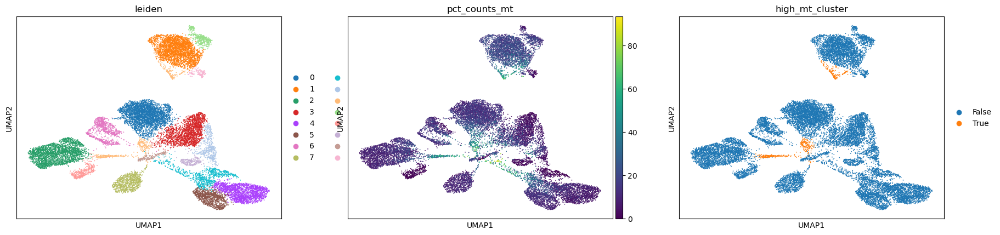

In [34]:
# Global stats
desc = adata_hvg.obs["pct_counts_mt"].describe()
q1, q3 = desc["25%"], desc["75%"]
iqr = q3 - q1
upper_whisker = q3 + 1.5 * iqr

print("Global pct_mt summary:")
print(desc)
print(f"Upper whisker ≈ {upper_whisker:.1f}%")

cluster_mt = adata_hvg.obs.groupby("leiden")["pct_counts_mt"].mean().sort_values()
print("\nMean pct_counts_mt per cluster:")
print(cluster_mt)

# Flag clusters whose mean is above the upper whisker
high_mt_clusters = cluster_mt[cluster_mt > upper_whisker].index.tolist()
print(f"\nHigh-mt clusters (mean > upper whisker ≈ {upper_whisker:.1f}%): {high_mt_clusters}")

adata_hvg.obs["high_mt_cluster"] = adata_hvg.obs["leiden"].isin(high_mt_clusters)

sc.pl.umap(adata_hvg, color=["leiden", "pct_counts_mt", "high_mt_cluster"])

# Saving Frozen AnnData

In [35]:
adata_hvg.write_h5ad("adata_HER2positive_HVG_UMAP_leiden_frozen.h5ad")
print("Saved frozen AnnData to adata_HER2positive_HVG_UMAP_leiden_frozen.h5ad")

Saved frozen AnnData to adata_HER2positive_HVG_UMAP_leiden_frozen.h5ad


# Marker Genes per Cluster (Top 20)

In [36]:
print("Computing marker genes per cluster")
sc.tl.rank_genes_groups(adata_hvg, groupby="leiden", method="wilcoxon")

# Extract top 20 per cluster
n_top = 20
marker_dict = {}

for cluster in adata_hvg.obs["leiden"].cat.categories:
    markers = sc.get.rank_genes_groups_df(adata_hvg, group=cluster).head(n_top)
    marker_dict[cluster] = markers["names"].tolist()
    print(f"Cluster {cluster}: {markers['names'].tolist()[:5]}...")  # show first 5

# Save markers
with open("HER2positive_cluster_markers_top20.pkl", "wb") as f:
    pickle.dump(marker_dict, f)

print("Saved cluster markers to HER2positive_cluster_markers_top20.pkl")

Computing marker genes per cluster
Cluster 0: ['CHMP2A', 'RPL28', 'RNF43', 'RPS5', 'PPP1R1B']...
Cluster 1: ['CCNI', 'IGFBP5', 'PDCD6', 'IGFBP2', 'RPL23']...
Cluster 2: ['CD24', 'H3F3B', 'CD164', 'RPL23A', 'CRABP2']...
Cluster 3: ['RPL28', 'RPS5', 'RPS11', 'RPL35', 'RPL12']...
Cluster 4: ['KRT10', 'IFI27', 'B2M', 'PSMB3', 'SCGB2A2']...
Cluster 5: ['KRT10', 'CALML5', 'FAM84B', 'RPS6', 'CHCHD2']...
Cluster 6: ['MGP', 'RPL34', 'PTN', 'RPL26', 'KRT15']...
Cluster 7: ['PSMB5', 'HSPB1', 'CCT2', 'RPL7', 'MRPL52']...
Cluster 8: ['SCGB2A2', 'MUCL1', 'IGKC', 'IGHG1', 'KRT10']...
Cluster 9: ['B2M', 'BTG1', 'RPS27', 'RPL34', 'RPS29']...
Cluster 10: ['MT-ND4', 'MT-CO2', 'MT-CO3', 'MT-ND1', 'MT-CYB']...
Cluster 11: ['PSMD11', 'RPL19', 'RPL23', 'IFI6', 'BST2']...
Cluster 12: ['RPL23A', 'CRABP2', 'H3F3B', 'CD24', 'COX6C']...
Cluster 13: ['SSR4', 'MZB1', 'IGKC', 'IGHG1', 'CYBA']...
Cluster 14: ['DCD', 'NDRG1', 'RPS29', 'RPL21', 'SQSTM1']...
Cluster 15: ['RPL19', 'RPS27', 'RPL24', 'RPL35A', 'RPL23']...


/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnase

#  Network Analysis - Chunked Correlation (3000×3000)

In [38]:
file_path = out_path
hvg_3000 = pd.read_csv("HER2positive_HVG_3000.txt", header=None)[0].astype(str).tolist()

chunksize = 1000
gene_sum = None
gene_sq_sum = None
n_cells_corr = 0

chunk_iter = pd.read_csv(file_path, index_col=0, chunksize=chunksize, low_memory=False)

print("Computing gene-gene correlation (pass 1: means)")
for ch in chunk_iter:
    ch = ch[hvg_3000]
    ch_values = ch.values.astype(np.float64)
    
    if gene_sum is None:
        n_genes_corr = ch_values.shape[1]
        gene_sum = np.zeros(n_genes_corr, dtype=np.float64)
        gene_sq_sum = np.zeros(n_genes_corr, dtype=np.float64)
    
    n = ch_values.shape[0]
    n_cells_corr += n
    gene_sum += ch_values.sum(axis=0)
    gene_sq_sum += (ch_values ** 2).sum(axis=0)

gene_mean_corr = gene_sum / n_cells_corr
gene_std = np.sqrt(gene_sq_sum / n_cells_corr - gene_mean_corr**2)

print(f"Pass 1 complete: {n_cells_corr} cells processed")

# Pass 2: covariance matrix
cov_matrix = np.zeros((n_genes_corr, n_genes_corr), dtype=np.float64)

chunk_iter = pd.read_csv(file_path, index_col=0, chunksize=chunksize, low_memory=False)

print("Computing gene-gene correlation (pass 2: covariance)")
for i, ch in enumerate(chunk_iter):
    if i % 20 == 0:
        print(f"  Chunk {i}")
    
    ch = ch[hvg_3000]
    ch_values = ch.values.astype(np.float64)
    
    # Center
    ch_centered = ch_values - gene_mean_corr
    
    # Accumulate covariance
    cov_matrix += ch_centered.T @ ch_centered

# Normalize to correlation
cov_matrix /= n_cells_corr
corr_matrix = cov_matrix / np.outer(gene_std, gene_std)

# Clip to [-1, 1] for numerical stability
corr_matrix = np.clip(corr_matrix, -1, 1)

print(f"Correlation matrix shape: {corr_matrix.shape}")
print(f"Min correlation: {corr_matrix.min():.3f}")
print(f"Max correlation: {corr_matrix.max():.3f}")

# Save correlation matrix
np.save("HER2positive_HVG_correlation_matrix.npy", corr_matrix)
print("Saved correlation matrix to HER2positive_HVG_correlation_matrix.npy")

Computing gene-gene correlation (pass 1: means)
Pass 1 complete: 18762 cells processed
Computing gene-gene correlation (pass 2: covariance)
  Chunk 0
Correlation matrix shape: (3000, 3000)
Min correlation: -0.685
Max correlation: 1.000
Saved correlation matrix to HER2positive_HVG_correlation_matrix.npy


# Alternative Heatmap: Top Connected HVGs

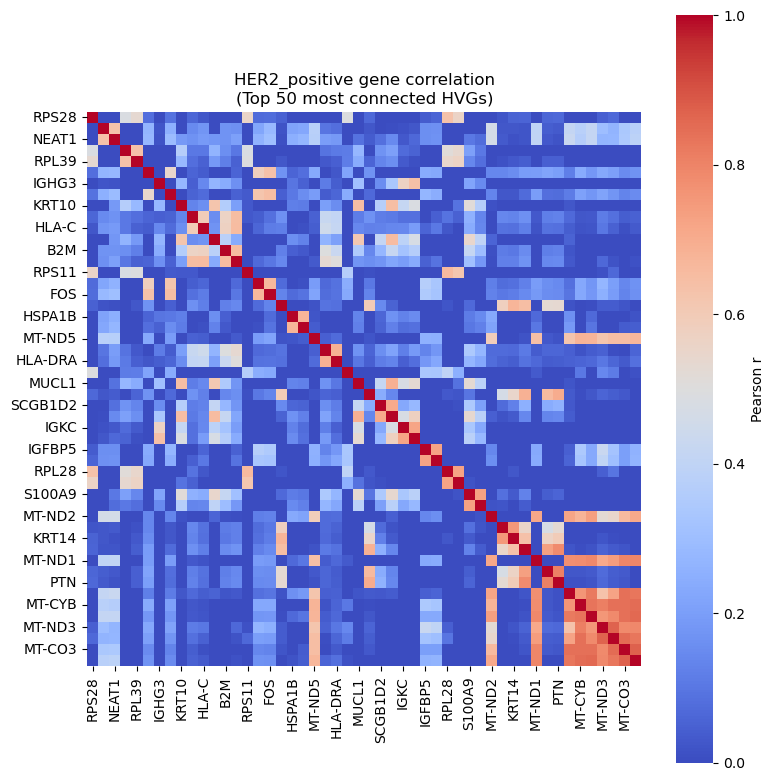

In [40]:
# Load correlation matrix
corr_matrix = np.load("HER2positive_HVG_correlation_matrix.npy")
hvg_3000 = pd.read_csv("HER2positive_HVG_3000.txt", header=None)[0].astype(str).tolist()

# For each gene, compute max(|r|) to any other gene
max_abs_r = np.max(np.abs(corr_matrix - np.eye(corr_matrix.shape[0])), axis=1)
top_n = 50
top_idx = np.argsort(max_abs_r)[-top_n:]
top_genes = [hvg_3000[i] for i in top_idx]

sub_corr = corr_matrix[np.ix_(top_idx, top_idx)]
corr_df = pd.DataFrame(sub_corr, index=top_genes, columns=top_genes)

plt.figure(figsize=(8, 8))
sns.heatmap(
    corr_df,
    cmap="coolwarm",
    vmin=0.0,
    vmax=1.0,
    square=True,
    cbar_kws={"label": "Pearson r"},
)
plt.title("HER2_positive gene correlation\n(Top 50 most connected HVGs)")
plt.tight_layout()
plt.show()

# Building Gene Co-Expression Network (|r| ≥ 0.45)

In [54]:
corr_matrix = np.load("HER2positive_HVG_correlation_matrix.npy")
hvg_3000 = pd.read_csv("HER2positive_HVG_3000.txt", header=None)[0].astype(str).tolist()

threshold = 0.35

# Build edge list
edges = []
n_genes_net = len(hvg_3000)

print(f"Building network with |r| >= {threshold}")
for i in range(n_genes_net):
    for j in range(i + 1, n_genes_net):
        r = corr_matrix[i, j]
        if abs(r) >= threshold:
            edges.append((hvg_3000[i], hvg_3000[j], {"weight": r}))

print(f"Found {len(edges)} edges")

# Create network
G = nx.Graph()
G.add_nodes_from(hvg_3000)
G.add_edges_from(edges)

print(f"Network: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# Save network
nx.write_graphml(G, "HER2positive_gene_network_r045.graphml")
print("Saved network to HER2positive_gene_network_r045.graphml")

Building network with |r| >= 0.35
Found 4966 edges
Network: 3000 nodes, 4966 edges
Saved network to HER2positive_gene_network_r045.graphml


# Visualizing Hub Genes Subnetwork

Top hubs (gene, degree): [('RPL41', 77), ('KRT10', 74), ('RPS8', 71), ('RPL19', 70), ('RPL30', 70), ('RPL39', 70), ('RPS2', 70), ('RPS15A', 70), ('G6PC3', 70), ('IGFBP5', 68), ('RPS12', 68), ('RPL10', 68), ('RPL13', 68), ('CCNI', 67), ('RPS3A', 67), ('RPS27A', 67), ('RPLP1', 67), ('RPL32', 66), ('RPL12', 66), ('RPS6', 65)]
Edges in H: 473


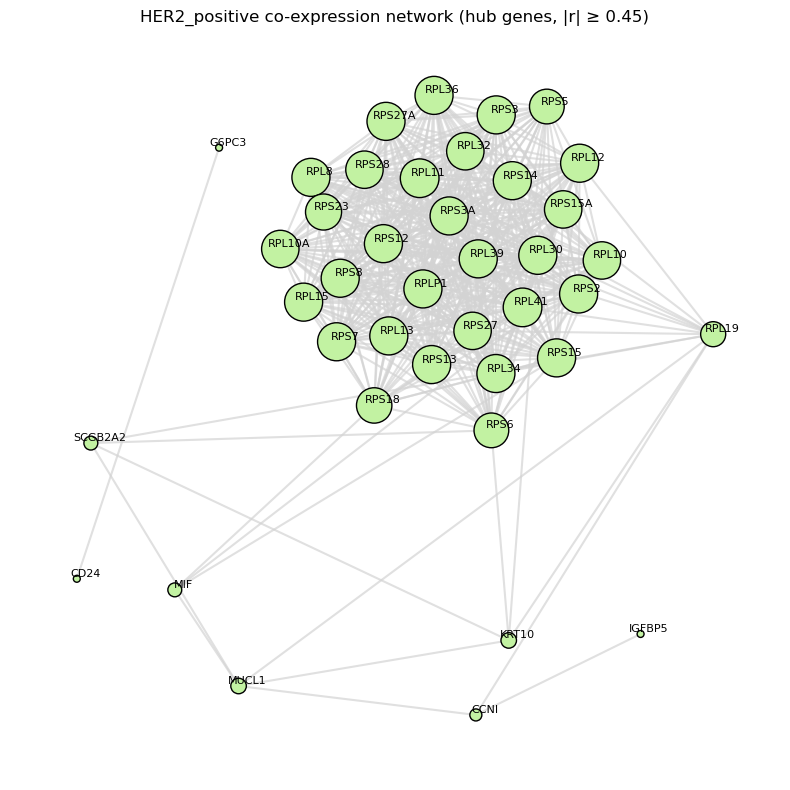

In [71]:
# Pick hub genes: top 50 by degree
N = 40
degree_dict = dict(G.degree())
top_hubs = sorted(degree_dict.items(), key=lambda x: x[1], reverse=True)[:N]
hub_genes = [g for g, d in top_hubs]

H = G.subgraph(hub_genes).copy()

# Optional sanity check
print("Top hubs (gene, degree):", top_hubs[:20])
print("Edges in H:", H.number_of_edges())

# Layout
pos = nx.spring_layout(H, seed=0, k=1.3)

# Node sizes proportional to degree
deg_H = dict(H.degree())
node_sizes = np.array([deg_H[g] for g in H.nodes()]) * 25

plt.figure(figsize=(8, 8))
nx.draw_networkx_edges(H, pos, width=1.5, edge_color="lightgrey", alpha=0.7)
nx.draw_networkx_nodes(H, pos, node_size=node_sizes, node_color="#c2f2a2", edgecolors="black")

for node, (x, y) in pos.items():
    plt.text(
        x + 0.02, y, node,
        fontsize=8,
        ha="center", va="bottom"
    )

plt.title("HER2_positive co-expression network (hub genes, |r| ≥ 0.45)")
plt.axis("off")
plt.tight_layout()
plt.show()

Top hubs (gene, degree): [('RPL41', 77), ('KRT10', 74), ('RPS8', 71), ('RPL19', 70), ('RPL30', 70), ('RPL39', 70), ('RPS2', 70), ('RPS15A', 70), ('G6PC3', 70), ('IGFBP5', 68), ('RPS12', 68), ('RPL10', 68), ('RPL13', 68), ('CCNI', 67), ('RPS3A', 67), ('RPS27A', 67), ('RPLP1', 67), ('RPL32', 66), ('RPL12', 66), ('RPS6', 65)]
Edges in H: 473


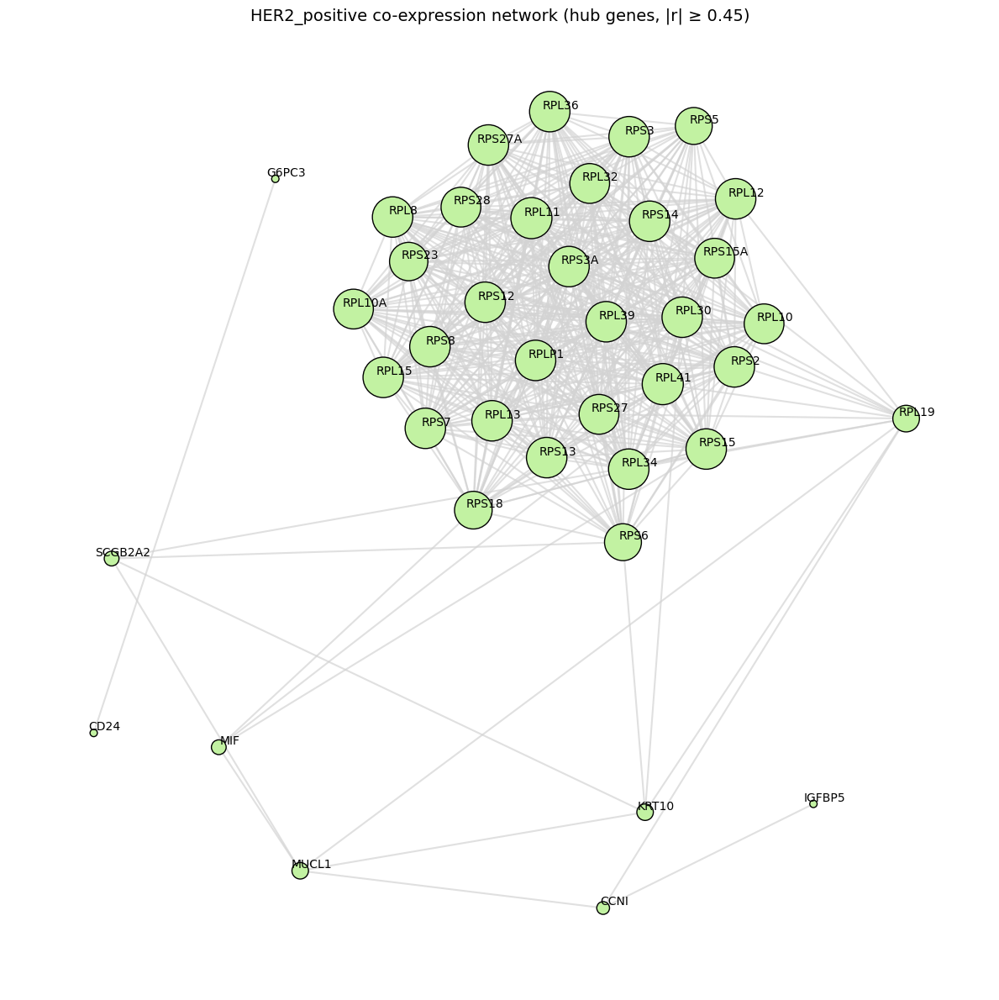

In [72]:
# Pick hub genes: top 50 by degree
N = 40
degree_dict = dict(G.degree())
top_hubs = sorted(degree_dict.items(), key=lambda x: x[1], reverse=True)[:N]
hub_genes = [g for g, d in top_hubs]

H = G.subgraph(hub_genes).copy()

print("Top hubs (gene, degree):", top_hubs[:20])
print("Edges in H:", H.number_of_edges())

pos = nx.spring_layout(H, seed=0, k=1.3)

deg_H = dict(H.degree())
node_sizes = np.array([deg_H[g] for g in H.nodes()]) * 40  # slightly larger

plt.figure(figsize=(12, 12))  # ← bigger figure
nx.draw_networkx_edges(H, pos, width=1.5, edge_color="lightgrey", alpha=0.7)
nx.draw_networkx_nodes(H, pos, node_size=node_sizes, node_color="#c2f2a2", edgecolors="black")

for node, (x, y) in pos.items():
    plt.text(
        x + 0.02, y, node,
        fontsize=10,        # larger labels
        ha="center", va="bottom"
    )

plt.title("HER2_positive co-expression network (hub genes, |r| ≥ 0.45)", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

# Detecting Modules (Louvain)

In [56]:
print("Detecting modules with Louvain")
modules = nx.community.louvain_communities(G, seed=42)

print(f"Found {len(modules)} modules")

# Create gene-to-module mapping
gene_to_module = {}
for module_id, gene_set in enumerate(modules):
    for gene in gene_set:
        gene_to_module[gene] = module_id

# Module sizes
module_sizes = [len(m) for m in modules]
print(f"Module sizes: min={min(module_sizes)}, max={max(module_sizes)}, median={np.median(module_sizes):.0f}")

# Save modules
with open("HER2positive_gene_modules.pkl", "wb") as f:
    pickle.dump(modules, f)

with open("HER2positive_gene_to_module.pkl", "wb") as f:
    pickle.dump(gene_to_module, f)

print("Saved modules to HER2positive_gene_modules.pkl and HER2positive_gene_to_module.pkl")

Detecting modules with Louvain
Found 2391 modules
Module sizes: min=1, max=154, median=1
Saved modules to HER2positive_gene_modules.pkl and HER2positive_gene_to_module.pkl


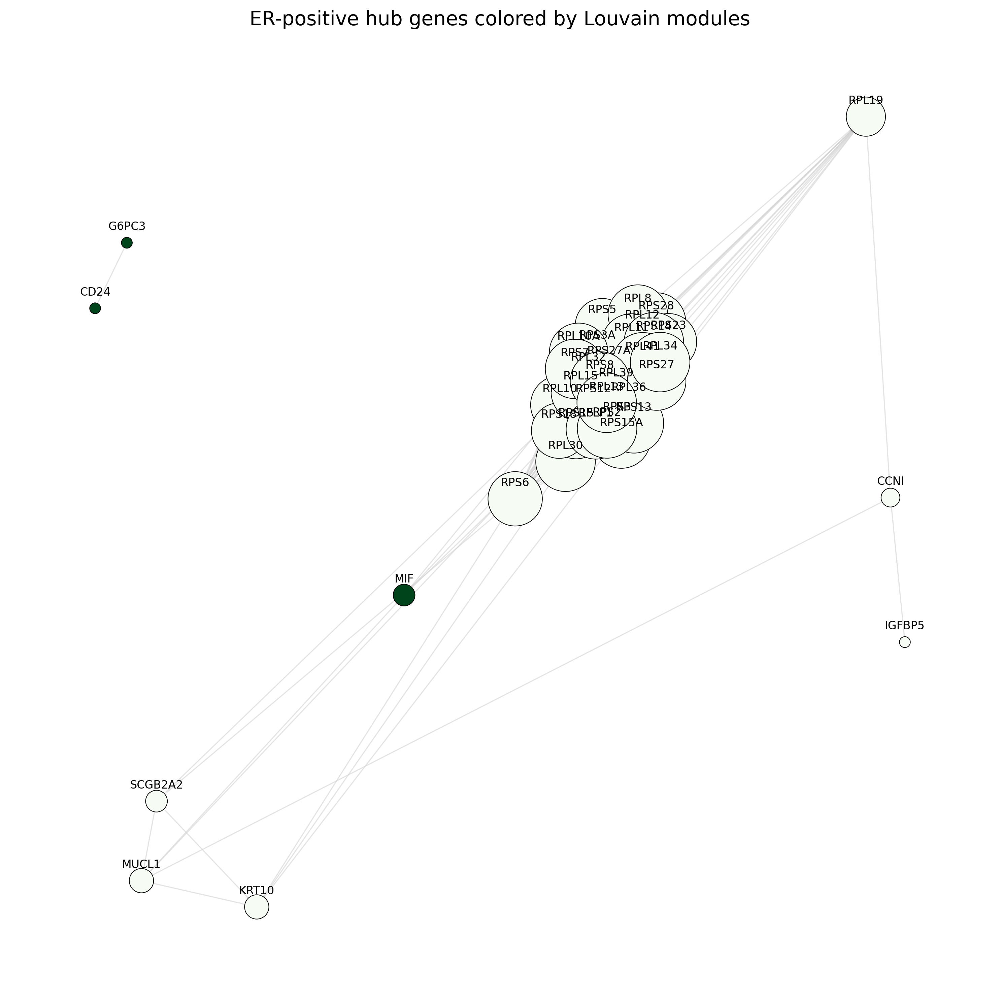

In [75]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

# assume: G, modules, gene_to_module already defined

# 1. Pick hub genes (top 40 by degree)
N = 40
degree_dict = dict(G.degree())
top_hubs = sorted(degree_dict.items(), key=lambda x: x[1], reverse=True)[:N]
hub_genes = [g for g, d in top_hubs]

H = G.subgraph(hub_genes).copy()

# 2. Layout (smaller k → tighter, more compact)
pos = nx.spring_layout(H, seed=0, k=0.25)

# 3. Node size by degree
deg_H = dict(H.degree())
node_sizes = np.array([deg_H[g] for g in H.nodes()]) * 60  # a bit larger

# 4. Module colors (greens instead of blues)
node_modules = [gene_to_module[g] for g in H.nodes()]

plt.figure(figsize=(10, 10), dpi=300)  # high-res for publication

# Edges (lighter and thinner so nodes + labels stand out)
nx.draw_networkx_edges(
    H,
    pos,
    width=0.8,
    edge_color="lightgrey",
    alpha=0.6,
)

# Nodes: colored by module, green colormap
nodes = nx.draw_networkx_nodes(
    H,
    pos,
    node_size=node_sizes,
    node_color=node_modules,
    cmap="Greens",        # <-- green colormap
    edgecolors="black",
    linewidths=0.5,
)

# 5. Labels: slightly larger and centered above
for node, (x, y) in pos.items():
    plt.text(
        x,
        y + 0.015,          # small vertical offset
        node,
        fontsize=8,
        ha="center",
        va="bottom",
    )

plt.title("ER-positive hub genes colored by Louvain modules", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

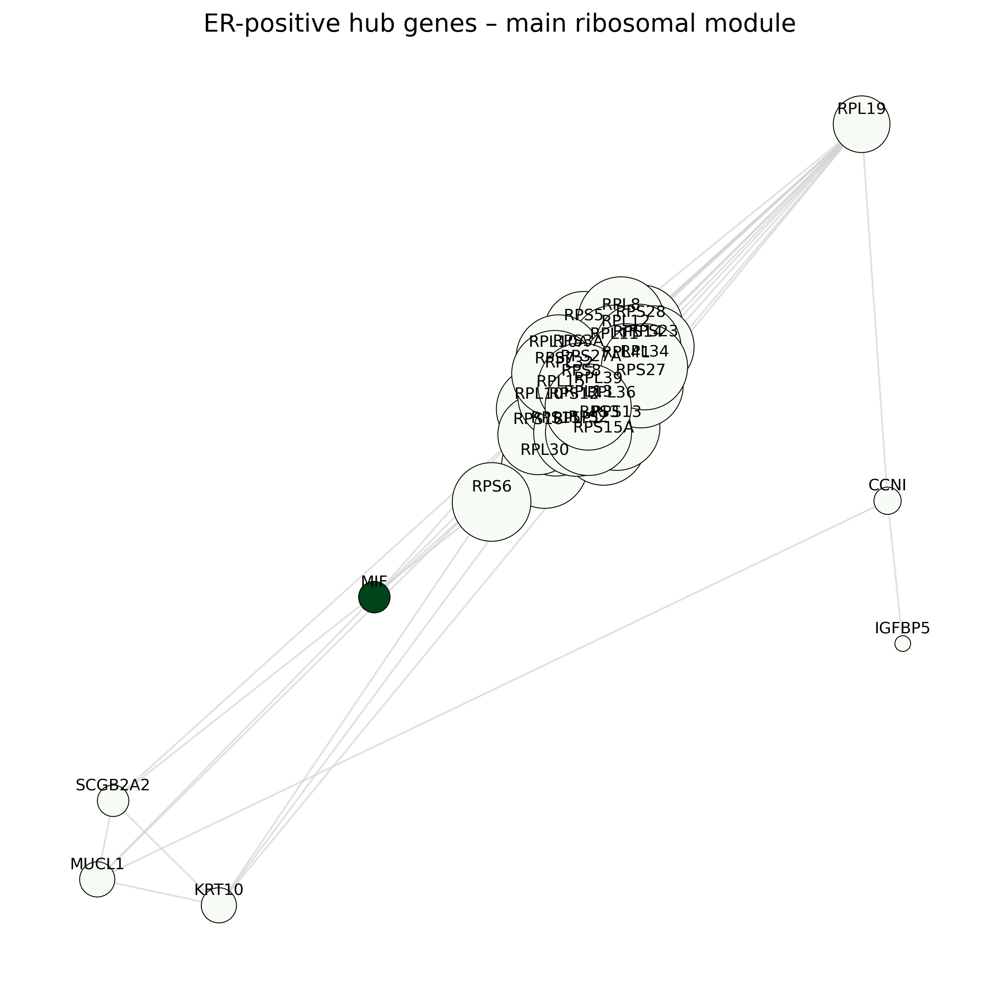

In [76]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

# H, gene_to_module already defined

# 1. Take largest connected component (the big blob)
components = list(nx.connected_components(H))
largest_cc = max(components, key=len)
H_big = H.subgraph(largest_cc).copy()

# 2. Reuse layout coords but only for these nodes
pos_big = {n: pos[n] for n in H_big.nodes()}  # pos from previous plot

# 3. Sizes and colors for this subgraph
deg_big = dict(H_big.degree())
node_sizes_big = np.array([deg_big[g] for g in H_big.nodes()]) * 80  # larger
node_modules_big = [gene_to_module[g] for g in H_big.nodes()]

plt.figure(figsize=(8, 8), dpi=300)

nx.draw_networkx_edges(
    H_big,
    pos_big,
    width=1.0,
    edge_color="lightgrey",
    alpha=0.7,
)

nodes = nx.draw_networkx_nodes(
    H_big,
    pos_big,
    node_size=node_sizes_big,
    node_color=node_modules_big,
    cmap="Greens",
    edgecolors="black",
    linewidths=0.5,
)

for node, (x, y) in pos_big.items():
    plt.text(
        x,
        y + 0.01,
        node,
        fontsize=9,
        ha="center",
        va="bottom",
    )

plt.title("ER-positive hub genes – main ribosomal module", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

# Showing the largest connected component

Largest component: 594 nodes, 4926 edges


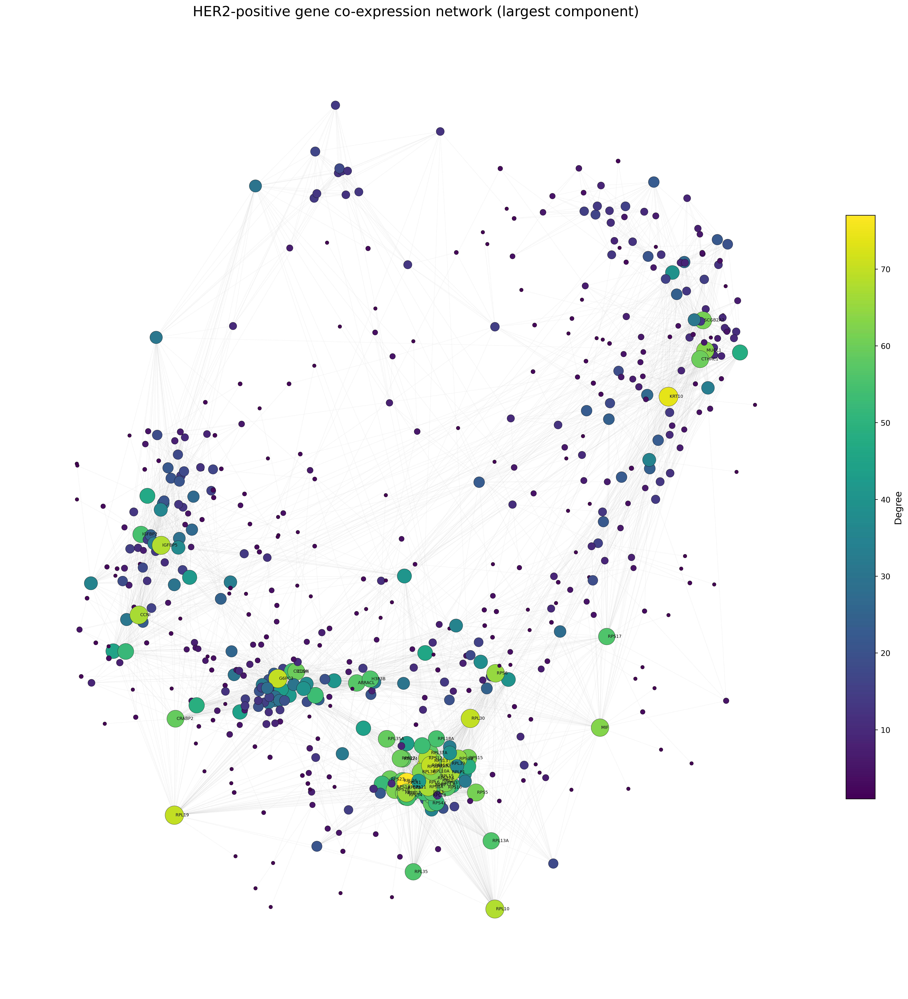

In [63]:
# Largest connected component
components = list(nx.connected_components(G))
largest = max(components, key=len)
G_lcc = G.subgraph(largest).copy()

print("Largest component:", G_lcc.number_of_nodes(), "nodes,", G_lcc.number_of_edges(), "edges")

# Layout (slightly stronger repulsion to separate clusters)
pos = nx.spring_layout(G_lcc, seed=0, k=0.35, iterations=200)

# Degree
deg_lcc = dict(G_lcc.degree())
deg_array = np.array([deg_lcc[g] for g in G_lcc.nodes()], dtype=float)

# Node sizes: mild scaling, avoid tiny dots
node_sizes = 15 + deg_array * 8

# Figure
plt.figure(figsize=(18, 18), dpi=400)

# 1) Edges: very light background structure
nx.draw_networkx_edges(
    G_lcc, pos,
    width=0.2,
    edge_color="grey",
    alpha=0.18,
)

# 2) Nodes: colored by degree (or keep teal if you prefer)
nodes = nx.draw_networkx_nodes(
    G_lcc, pos,
    node_size=node_sizes,
    node_color=deg_array,
    cmap="viridis",
    edgecolors="black",
    linewidths=0.25,
)

# Optional colorbar for degree
cbar = plt.colorbar(nodes, shrink=0.6, pad=0.02)
cbar.set_label("Degree", fontsize=12)

# 3) Label only top K hubs
K = 60
top_hubs_lcc = sorted(deg_lcc.items(), key=lambda x: x[1], reverse=True)[:K]
label_genes = set(g for g, d in top_hubs_lcc)

for gene, (x, y) in pos.items():
    if gene in label_genes:
        plt.text(
            x + 0.003, y, gene,
            fontsize=5.5,
            ha="left", va="center",
            color="black",
        )

plt.title("HER2-positive gene co-expression network (largest component)", fontsize=18)
plt.axis("off")
plt.tight_layout()

# Save high-resolution version
plt.savefig(
    "HER2positive_network_largest_component_pubready.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

# Hub Genes per Module (Top 10 by Degree)

In [64]:
module_hubs = {}

for module_id, gene_set in enumerate(modules):
    subgraph = G.subgraph(gene_set)
    degrees = dict(subgraph.degree())
    
    # Sort by degree
    sorted_genes = sorted(degrees.items(), key=lambda x: x, reverse=True)
    top_10 = [gene for gene, deg in sorted_genes[:10]]
    
    module_hubs[module_id] = top_10
    print(f"Module {module_id} ({len(gene_set)} genes): {top_10[:5]}...")  # show first 5

# Save hubs
with open("HER2positive_module_hubs_top10.pkl", "wb") as f:
    pickle.dump(module_hubs, f)

print("Saved module hubs to HER2positive_module_hubs_top10.pkl")

Module 0 (90 genes): ['SUZ12', 'SUMO3', 'STC2', 'STARD3', 'SRP9']...
Module 1 (30 genes): ['SPINT2', 'RTN4', 'PNISR', 'PLPP2', 'PGAP3']...
Module 2 (23 genes): ['TACSTD2', 'RAB11FIP1', 'PPP1R15A', 'NR4A1', 'MCL1']...
Module 3 (1 genes): ['SAT1']...
Module 4 (2 genes): ['KRT8', 'KRT18']...
Module 5 (1 genes): ['MDK']...
Module 6 (1 genes): ['DCD']...
Module 7 (1 genes): ['HSP90AA1']...
Module 8 (1 genes): ['SSR4']...
Module 9 (1 genes): ['HSPA8']...
Module 10 (1 genes): ['AGR2']...
Module 11 (94 genes): ['SNHG8', 'SKP1', 'S100A11', 'RPSA', 'RPS9']...
Module 12 (1 genes): ['CALM2']...
Module 13 (1 genes): ['HSPE1']...
Module 14 (1 genes): ['PRDX1']...
Module 15 (1 genes): ['SUB1']...
Module 16 (2 genes): ['TCAP', 'PNMT']...
Module 17 (1 genes): ['ACTB']...
Module 18 (2 genes): ['S100A16', 'S100A14']...
Module 19 (1 genes): ['HMGN2']...
Module 20 (139 genes): ['STAT1', 'SRP14', 'SQLE', 'SPTSSB', 'SPTSSA']...
Module 21 (1 genes): ['IER3']...
Module 22 (1 genes): ['COX7A2']...
Module 23 (1 

In [65]:
print("\n" + "="*60)
print("HER2_positive analysis complete!")
print("="*60)
print(f"QC-passed cells: {adata_hvg.n_obs}")
print(f"HVGs: {len(hvg_3000)}")
print(f"Leiden clusters: {len(adata_hvg.obs['leiden'].cat.categories)}")
print(f"Network edges: {G.number_of_edges()}")
print(f"Modules: {len(modules)}")
print("\nOutput files:")
print("  - HER2positive_QC_cells.txt")
print("  - HER2positive_QC_CP10k_log1p_forWGCNA.csv")
print("  - HER2positive_HVG_3000.txt")
print("  - adata_HER2positive_HVG_UMAP_leiden_frozen.h5ad")
print("  - HER2positive_cluster_markers_top20.pkl")
print("  - HER2positive_HVG_correlation_matrix.npy")
print("  - HER2positive_gene_network_r045.graphml")
print("  - HER2positive_gene_modules.pkl")
print("  - HER2positive_gene_to_module.pkl")
print("  - HER2positive_module_hubs_top10.pkl")


HER2_positive analysis complete!
QC-passed cells: 18762
HVGs: 3000
Leiden clusters: 16
Network edges: 4966
Modules: 2391

Output files:
  - HER2positive_QC_cells.txt
  - HER2positive_QC_CP10k_log1p_forWGCNA.csv
  - HER2positive_HVG_3000.txt
  - adata_HER2positive_HVG_UMAP_leiden_frozen.h5ad
  - HER2positive_cluster_markers_top20.pkl
  - HER2positive_HVG_correlation_matrix.npy
  - HER2positive_gene_network_r045.graphml
  - HER2positive_gene_modules.pkl
  - HER2positive_gene_to_module.pkl
  - HER2positive_module_hubs_top10.pkl
